In [1]:
!cp -r "../input/speaker-recognition-dataset" ./

In [2]:
import os
import numpy as np
import shutil
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import librosa
import soundfile as sf
from pathlib import Path
from IPython.display import display, Audio

SEPREATING AUDIO AND NOISE FOLDER

In [3]:
data_directory = "./speaker-recognition-dataset/16000_pcm_speeches"
audio_folder = "audio"
noise_folder = "noise"

audio_path = os.path.join(data_directory, audio_folder)
noise_path = os.path.join(data_directory, noise_folder)

In [4]:
for folder in os.listdir(data_directory):
    if os.path.isdir(os.path.join(data_directory, folder)):
        if folder in [audio_folder, noise_folder]:
            
            continue
        elif folder in ["other", "_background_noise_"]:
            
            shutil.move(
                os.path.join(data_directory, folder),
                os.path.join(noise_path, folder),
            )
        else:
            shutil.move(
                os.path.join(data_directory, folder),
                os.path.join(audio_path, folder),
            )

In [5]:
os.listdir(audio_path)


['Benjamin_Netanyau',
 'Magaret_Tarcher',
 'Julia_Gillard',
 'Nelson_Mandela',
 'Jens_Stoltenberg']

 **EDA ON AUDIO FOLDER**

In [6]:
num_voice=[]
for i in os.listdir(audio_path):
    p=os.listdir(audio_path+"/"+i)
    len_class=len(p)
    num_voice.append(len_class)
num_voice

[1500, 1500, 1501, 1500, 1500]

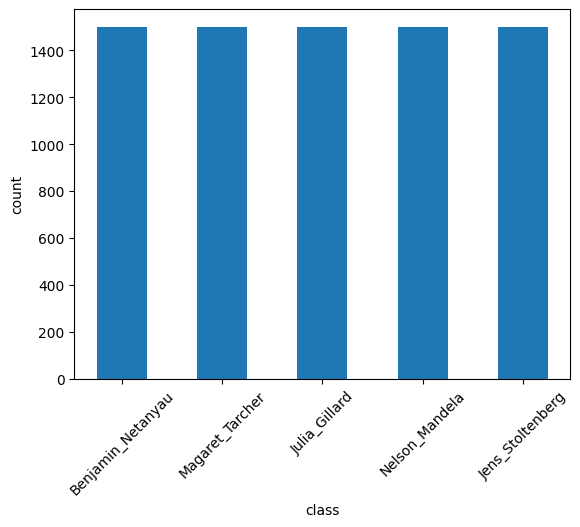

In [7]:

plt.bar(os.listdir(audio_path),num_voice,width=0.5)
plt.xticks(rotation=45)
plt.ylabel("count")
plt.xlabel("class")
plt.show()

Balanced classes almost 1500 wav files in each folder

FUNCTION FOR WAVEPLOT AND SPECTOGRAM

In [8]:
from scipy.io import wavfile
import scipy.signal as scisignal
def waveplot(data,sr,speaker):
    plt.figure(figsize=(10,4))
    plt.title(speaker)
    librosa.display.waveshow(data,sr=sr)
    plt.show()
def spectogram(data,sr,speaker):
    x=librosa.feature.melspectrogram(y=data,sr=sr,n_mels=256,)
    xdb_mel=librosa.amplitude_to_db(x,ref=np.max)
    fig,ax=plt.subplots(figsize=(15,5))
    img=librosa.display.specshow(xdb_mel,x_axis='time',y_axis='log',ax=ax)
    ax.set_title('Mel Spectogram')
    fig.colorbar(img,ax=ax,format=f'%0.2f')
    plt.show()
def plot_mfcc(audio, sample_rate):
    # Compute MFCCs
    mfccs = librosa.feature.mfcc(y=audio, sr=sample_rate,n_mfcc=13)

    # Plot the MFCCs
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(mfccs, x_axis='time', sr=sample_rate)
    plt.colorbar()
    plt.title('MFCC')
    plt.ylabel('MFCC Coefficients')
    plt.tight_layout()
    plt.show()
    return mfccs
def preemphasis_and_waveplot(audio,sr, preemphasis_coeff=0.97):

    # Apply the preemphasis filter
    emphasized_signal = np.append(audio[0], audio[1:] - preemphasis_coeff * audio[:-1])

    # Create the waveplot
    plt.figure(figsize=(14, 5))
    librosa.display.waveshow(emphasized_signal, sr=sr)
    plt.title("Pre-emphasized audio")
    plt.show()
    sf.write("/kaggle/working/output.wav",emphasized_signal,sr)
    return emphasized_signal,sr

FUNCTION FOR COMBINING  WAV FILES

In [9]:
from pydub import AudioSegment

def combine_audio_files(path,num):
    files = [f"{path}/{i}.wav" for i in range(num)]  

    combined_audio = AudioSegment.empty()

    # Load and combine your audio files using a loop
    for audio_file in files:
        audio = AudioSegment.from_file(audio_file, format="wav")
        combined_audio += audio

    sample_rate = combined_audio.frame_rate
    print(sample_rate)

    # Extract the last word from the path and append 'c' to it for the filename
    filename = os.path.split(path)[-1] + "c.wav"
    
    combined_audio.export(f"/kaggle/working/{filename}", format="wav")
    return 

In [10]:
combine_audio_files('./speaker-recognition-dataset/16000_pcm_speeches/audio/Benjamin_Netanyau',20)
combine_audio_files('./speaker-recognition-dataset/16000_pcm_speeches/audio/Jens_Stoltenberg',20)
combine_audio_files('./speaker-recognition-dataset/16000_pcm_speeches/audio/Julia_Gillard',10)
combine_audio_files('./speaker-recognition-dataset/16000_pcm_speeches/audio/Magaret_Tarcher',10)
combine_audio_files('./speaker-recognition-dataset/16000_pcm_speeches/audio/Nelson_Mandela',10)


16000
16000
16000
16000
16000


**Benjamin_Netanyau**

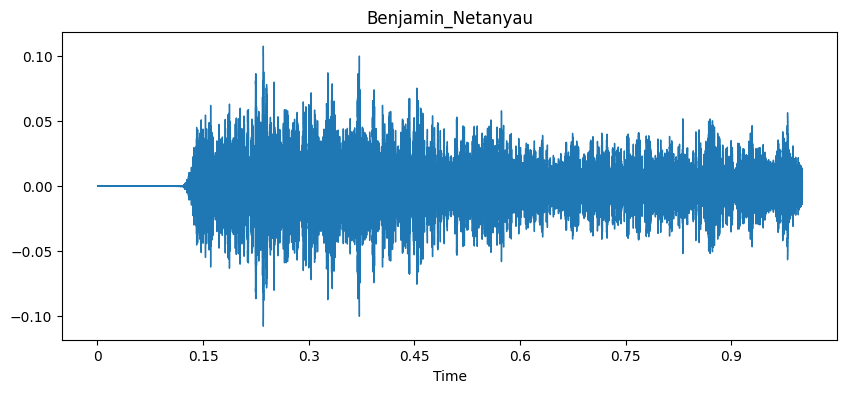

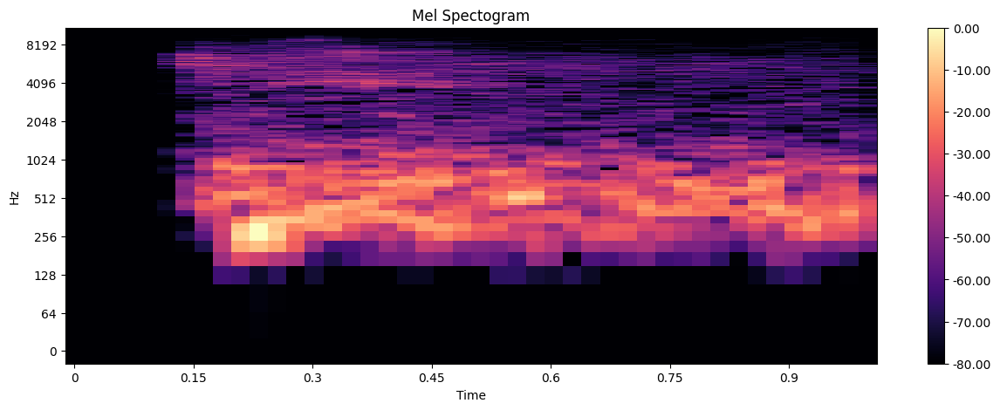

In [11]:
speaker="Benjamin_Netanyau"
path='./speaker-recognition-dataset/16000_pcm_speeches/audio/Benjamin_Netanyau/0.wav'
data,sample_rat=librosa.load(path)
waveplot(data,sample_rat,speaker)
spectogram(data,sample_rat,speaker)

Audio(path)



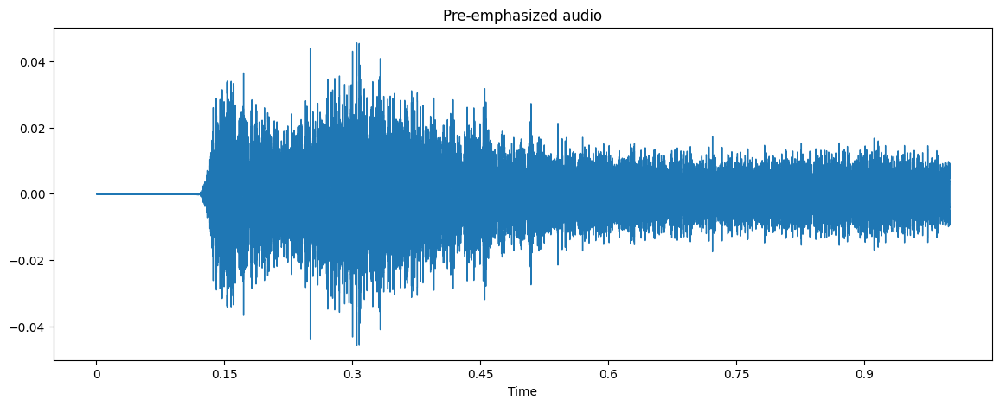

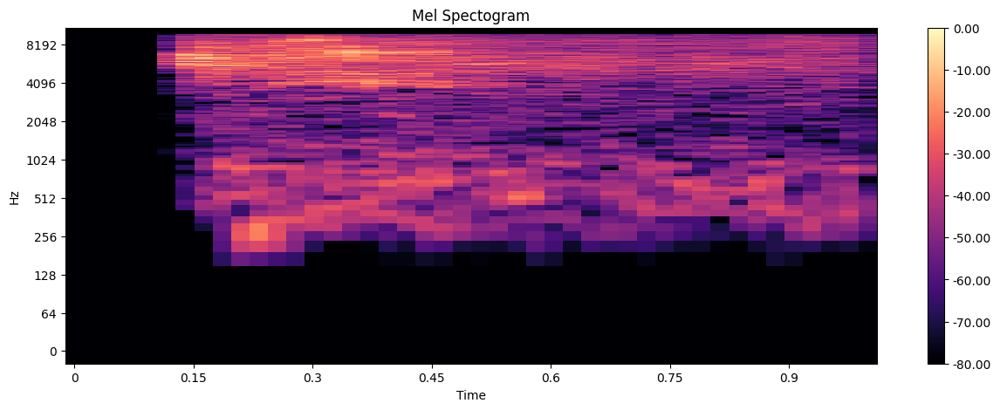

In [12]:
data,sample_rat=preemphasis_and_waveplot(data,sample_rat)
spectogram(data,sample_rat,speaker)
Audio("/kaggle/working/output.wav")

For feature extraction example

In [13]:
data_ft=data
sample_rat_ft=sample_rat

<Axes: >

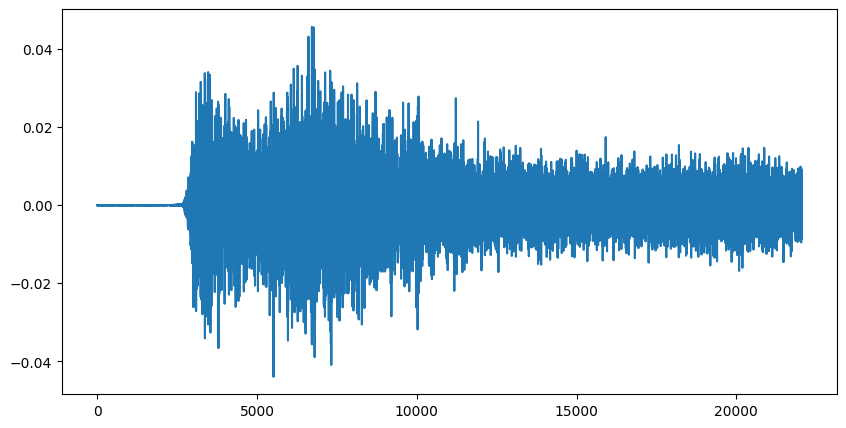

In [14]:
pd.Series(data).plot(figsize=(10,5))

<Axes: >

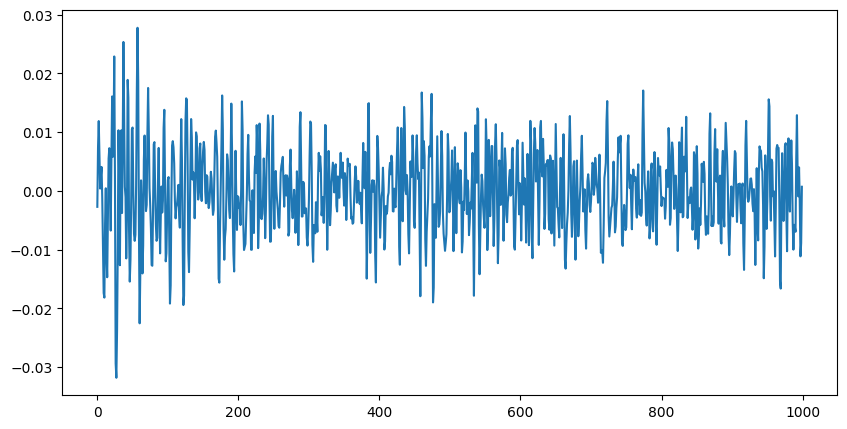

In [15]:
pd.Series(data[10000:11000]).plot(figsize=(10,5))

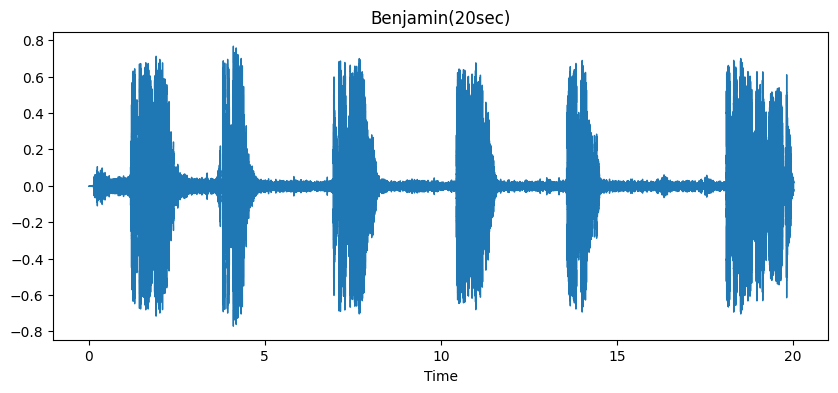

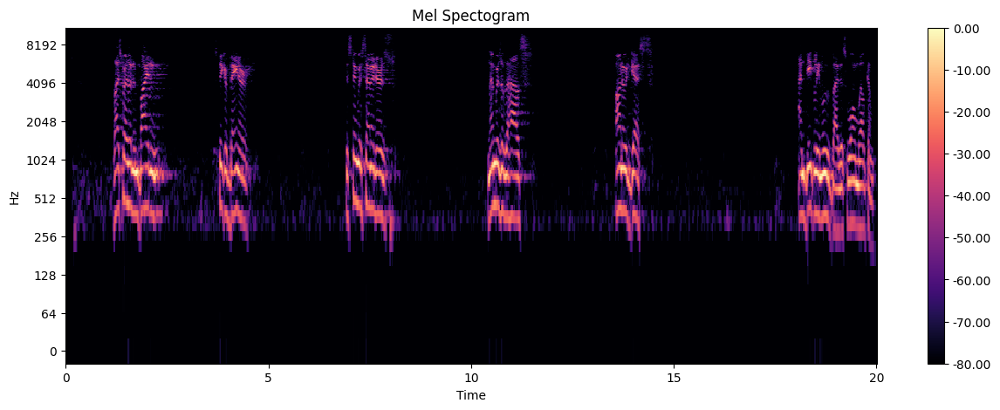

In [16]:
speaker="Benjamin(20sec)"
path='/kaggle/working/Benjamin_Netanyauc.wav'
data,sample_rat=librosa.load(path)
waveplot(data,sample_rat,speaker)
spectogram(data,sample_rat,speaker)
Audio(path)

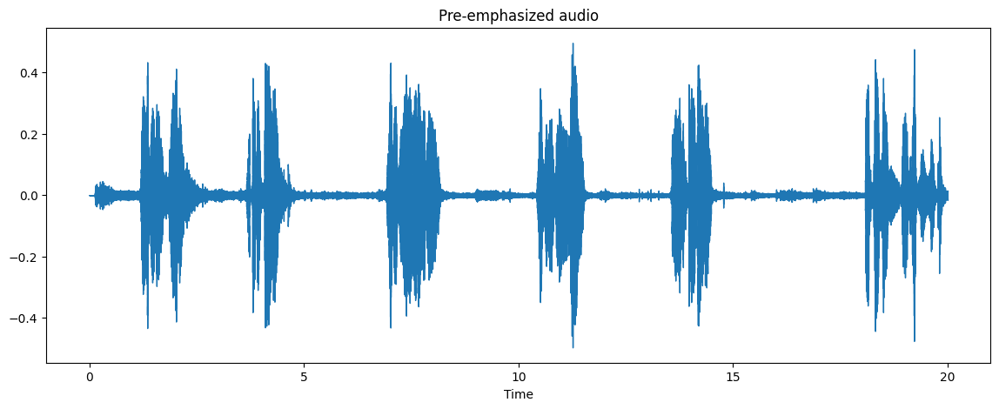

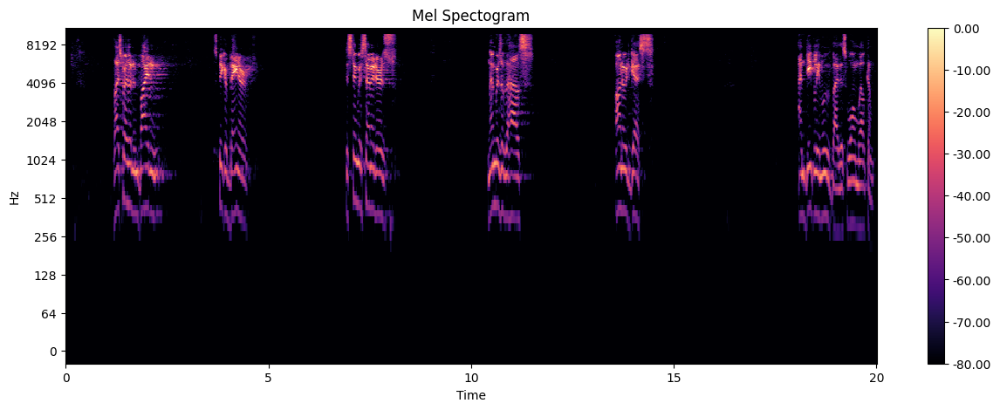

In [17]:
data,sample_rat=preemphasis_and_waveplot(data,sample_rat)
spectogram(data,sample_rat,speaker)
Audio("/kaggle/working/output.wav")

**Jens_Stoltenberg**

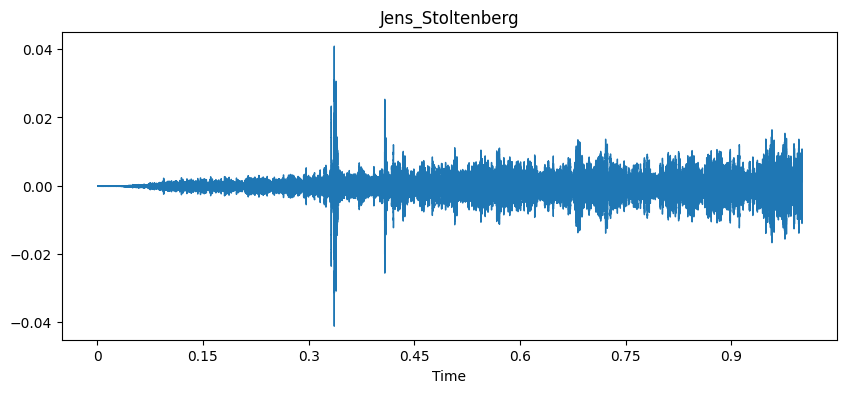

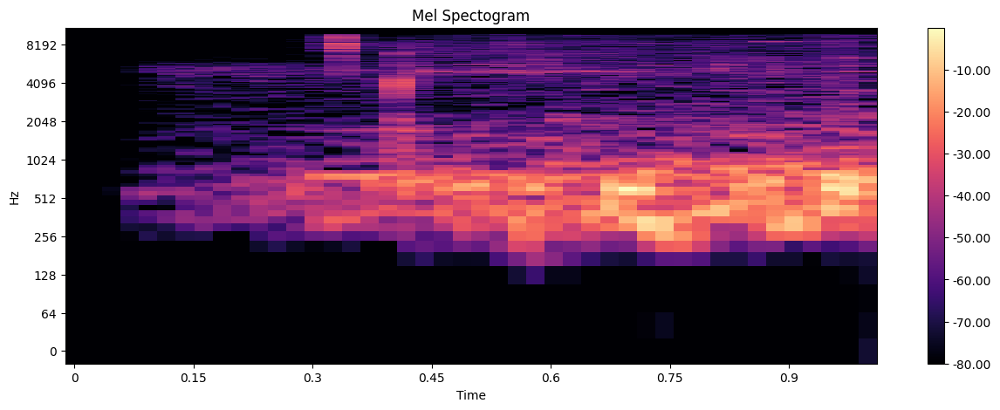

In [18]:
speaker="Jens_Stoltenberg"
path='./speaker-recognition-dataset/16000_pcm_speeches/audio/Jens_Stoltenberg/0.wav'
data,sample_rate=librosa.load(path)
waveplot(data,sample_rate,speaker)
spectogram(data,sample_rate,speaker)
Audio(path)

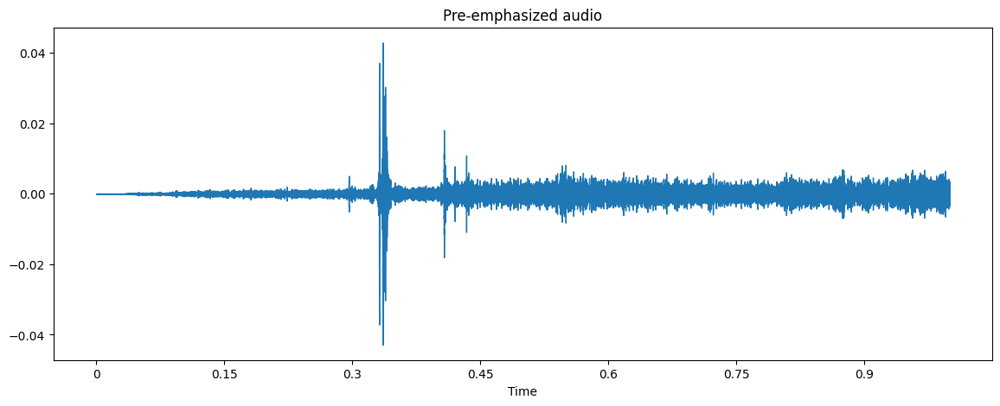

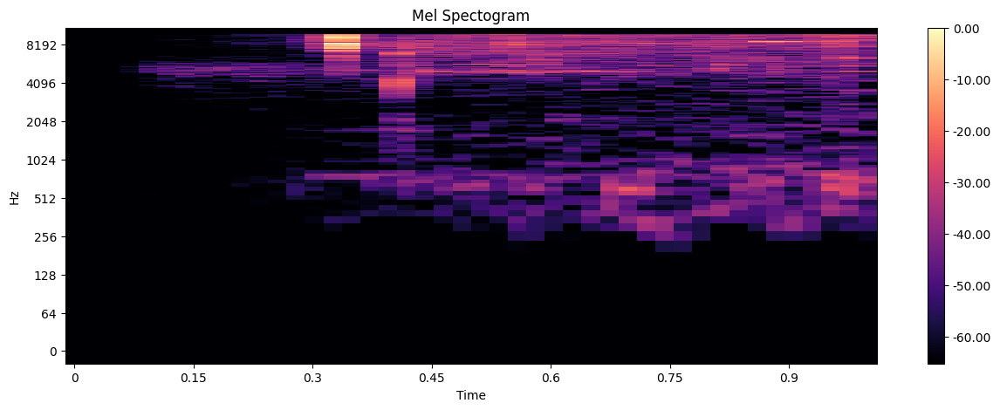

In [19]:
data,sample_rate=preemphasis_and_waveplot(data,sample_rate)
spectogram(data,sample_rat,speaker)
Audio("/kaggle/working/output.wav")

<Axes: >

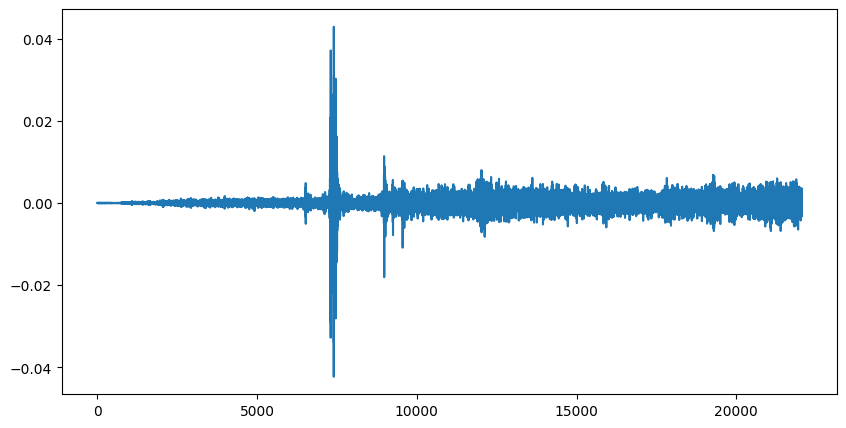

In [20]:
pd.Series(data).plot(figsize=(10,5))

<Axes: >

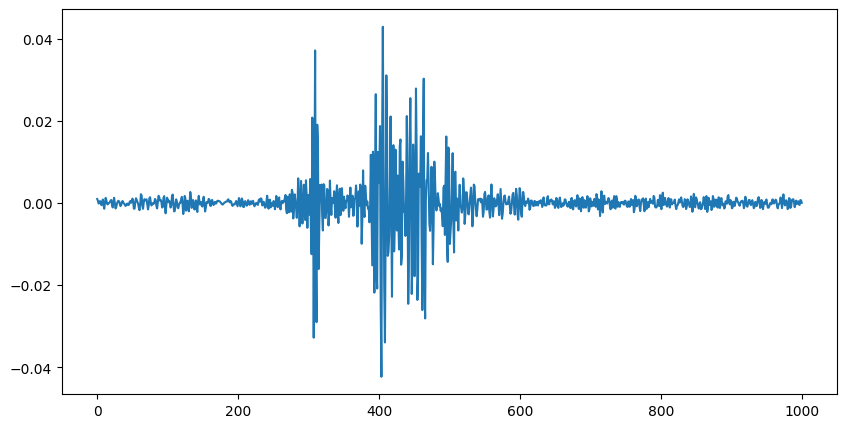

In [21]:
pd.Series(data[7000:8000]).plot(figsize=(10,5))

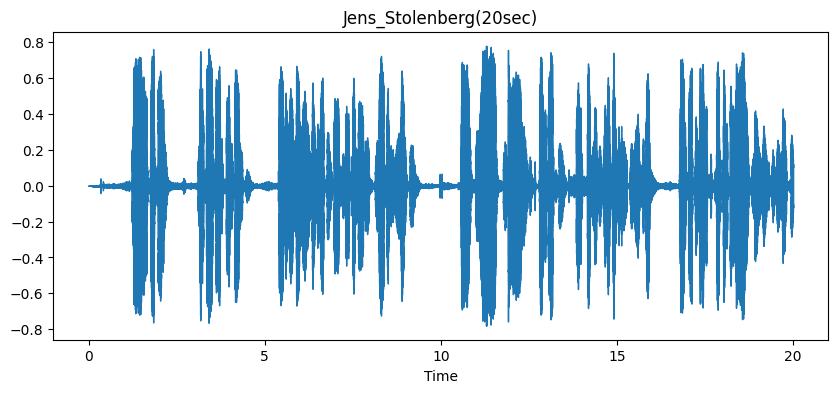

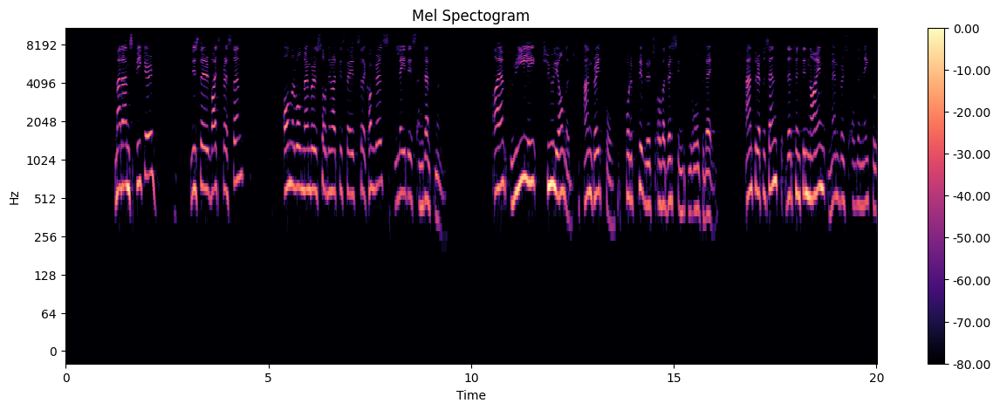

In [22]:
speaker="Jens_Stolenberg(20sec)"
path='/kaggle/working/Jens_Stoltenbergc.wav'
data,sample_rate=librosa.load(path)
waveplot(data,sample_rate,speaker)
spectogram(data,sample_rate,speaker)
Audio(path)

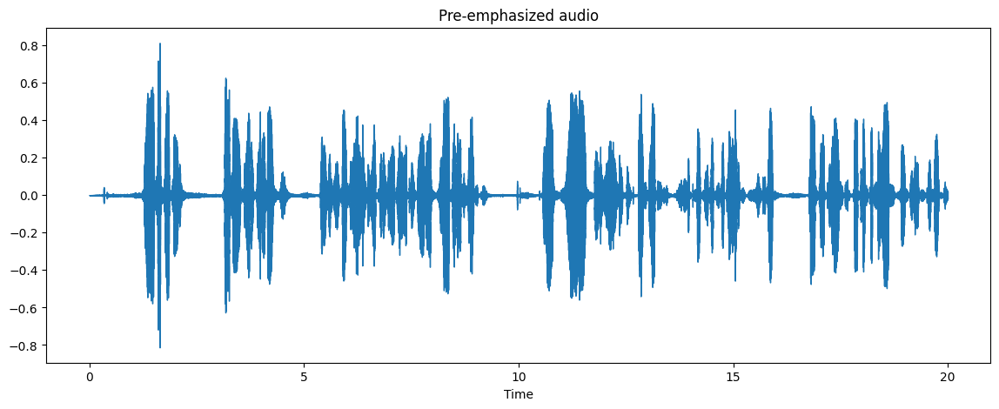

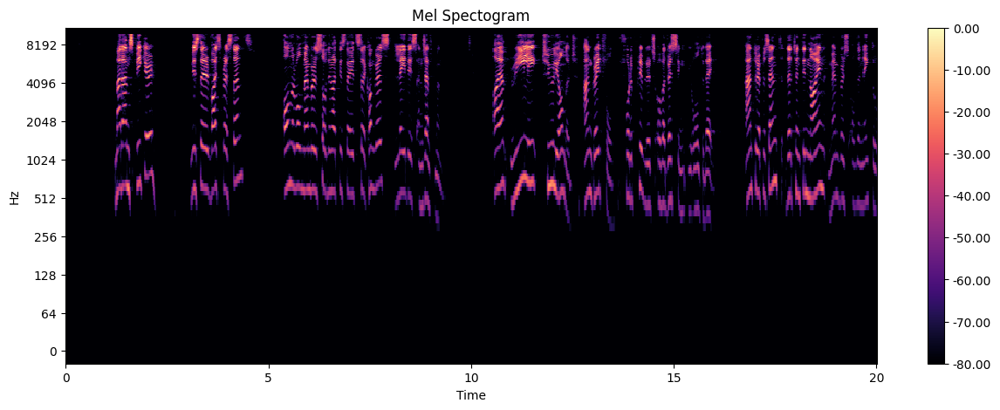

In [23]:
data,sample_rat=preemphasis_and_waveplot(data,sample_rate)
spectogram(data,sample_rate,speaker)
Audio("/kaggle/working/output.wav")

**Julia_Gillard**

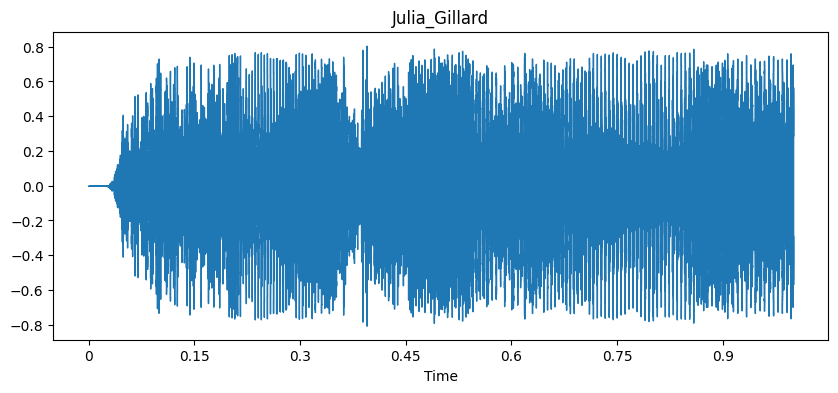

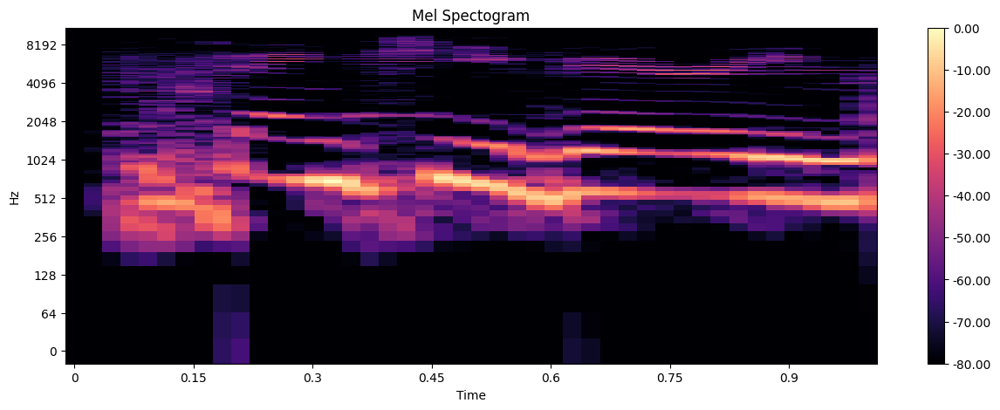

In [24]:
speaker="Julia_Gillard"
path='./speaker-recognition-dataset/16000_pcm_speeches/audio/Julia_Gillard/0.wav'
data,sample_rate=librosa.load(path)
waveplot(data,sample_rate,speaker)
spectogram(data,sample_rate,speaker)
Audio(path)

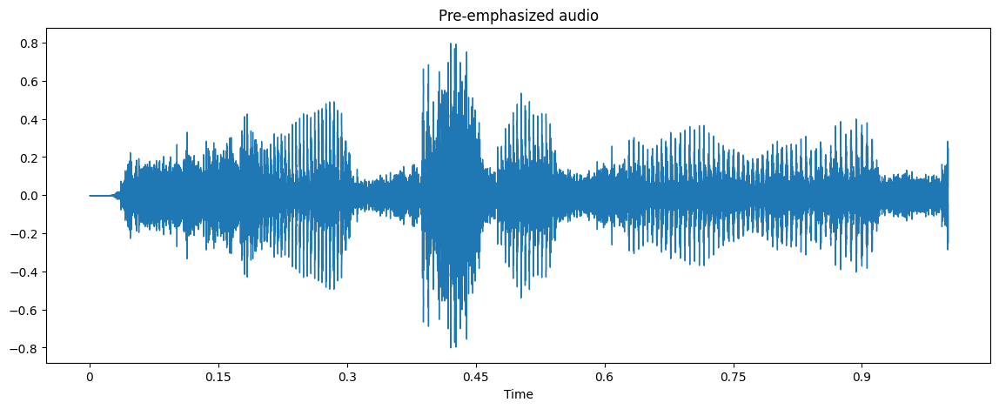

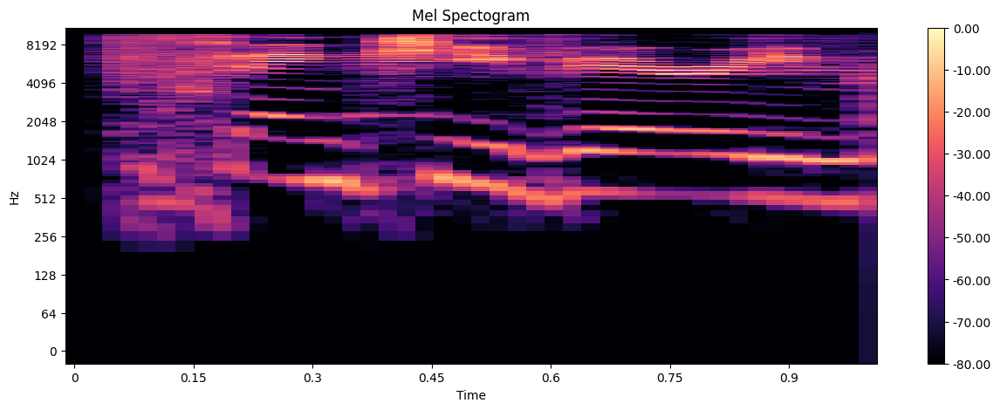

In [25]:
data,sample_rate=preemphasis_and_waveplot(data,sample_rate)
spectogram(data,sample_rate,speaker)
Audio("/kaggle/working/output.wav")

<Axes: >

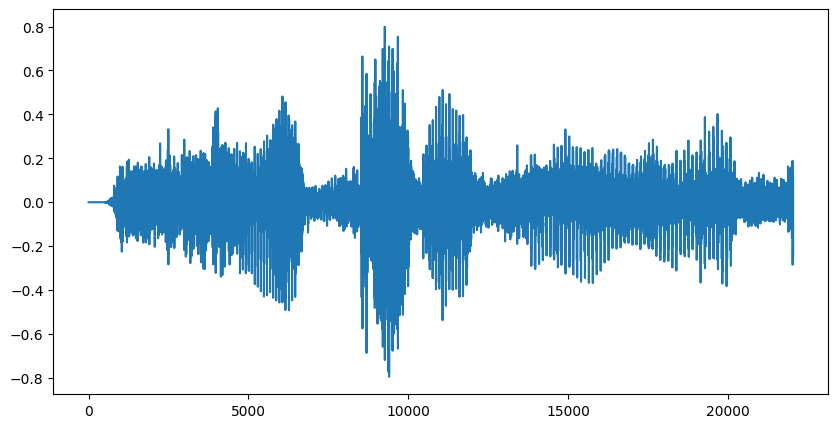

In [26]:
pd.Series(data).plot(figsize=(10,5))

<Axes: >

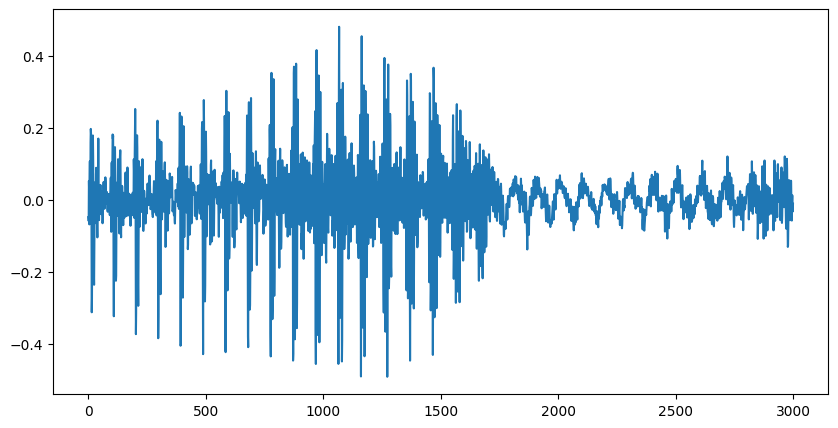

In [27]:
pd.Series(data[5000:8000]).plot(figsize=(10,5))

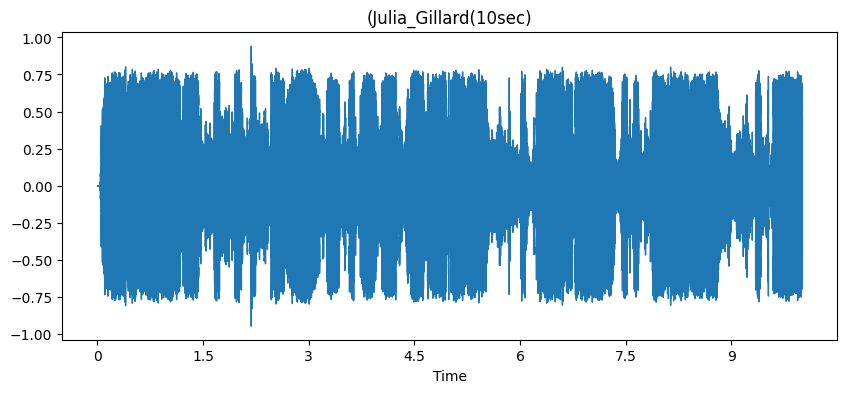

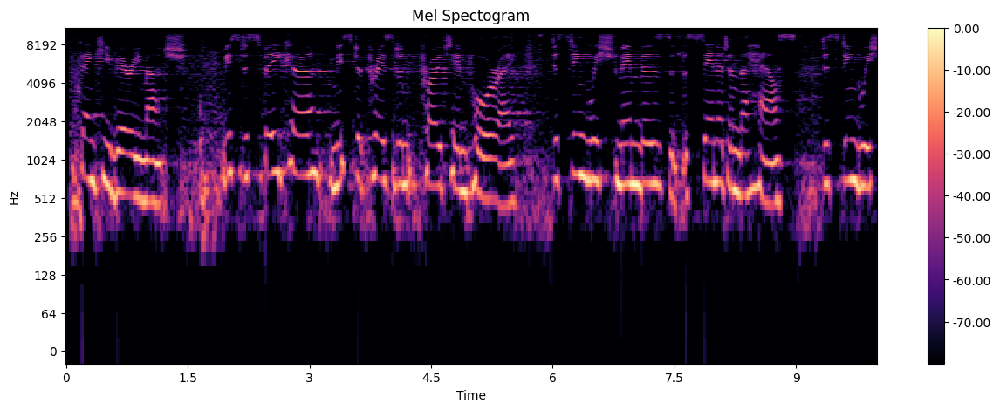

In [28]:
speaker="(Julia_Gillard(10sec)"
path='/kaggle/working/Julia_Gillardc.wav'
data,sample_rate=librosa.load(path)
waveplot(data,sample_rate,speaker)
spectogram(data,sample_rate,speaker)
Audio(path)

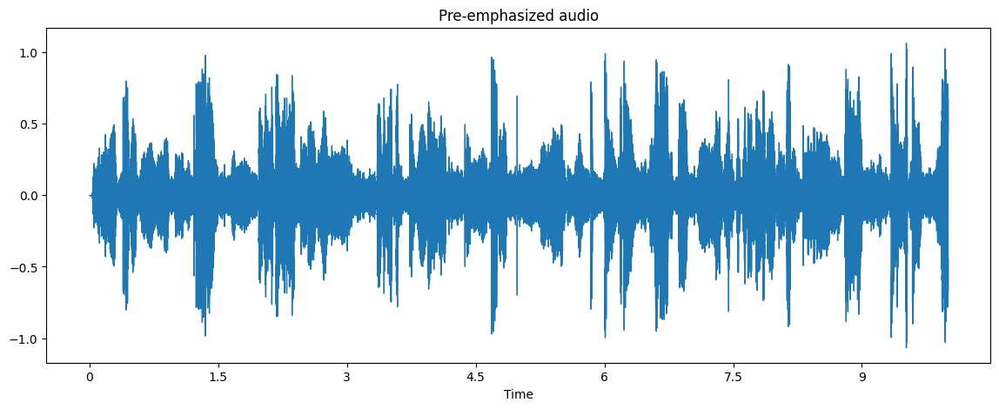

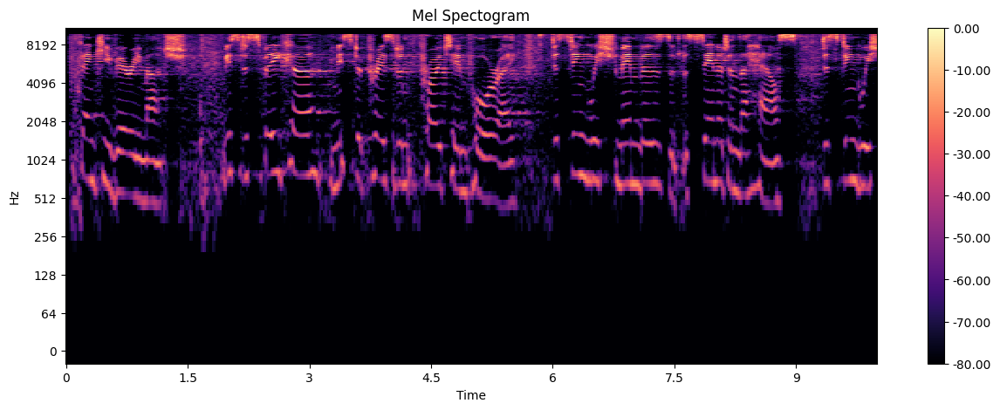

In [29]:
data,sample_rate=preemphasis_and_waveplot(data,sample_rate)
spectogram(data,sample_rate,speaker)
Audio("/kaggle/working/output.wav")

**Magaret_Tarcher**

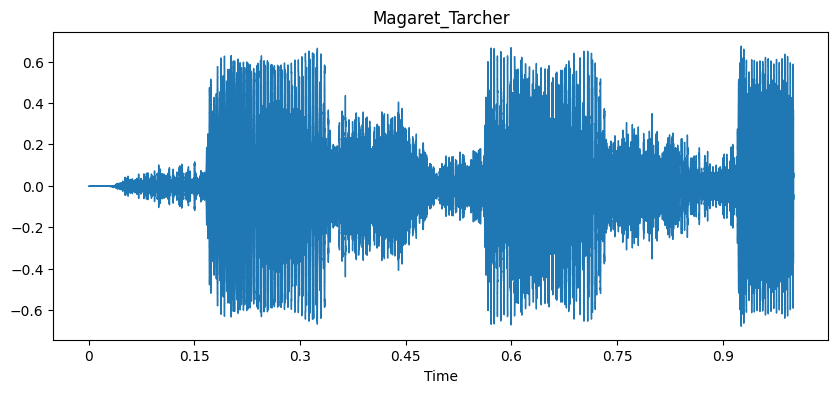

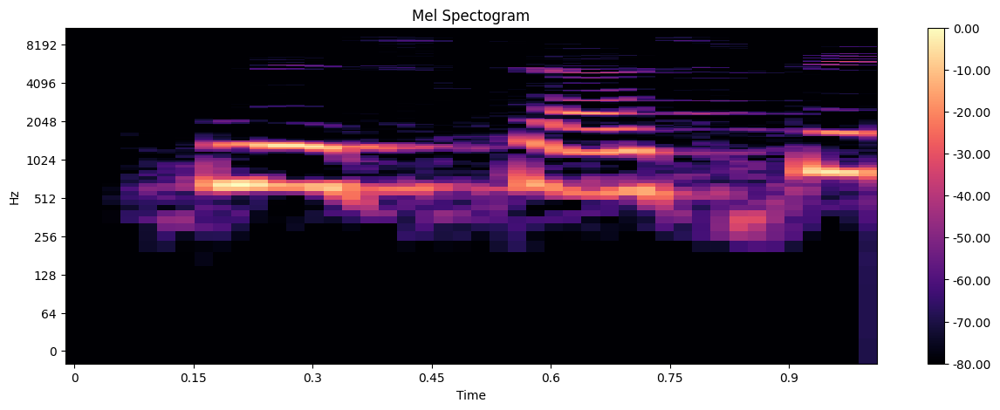

In [30]:
speaker="Magaret_Tarcher"
path='./speaker-recognition-dataset/16000_pcm_speeches/audio/Magaret_Tarcher/0.wav'
data,sample_rate=librosa.load(path)
waveplot(data,sample_rate,speaker)
spectogram(data,sample_rate,speaker)
Audio(path)

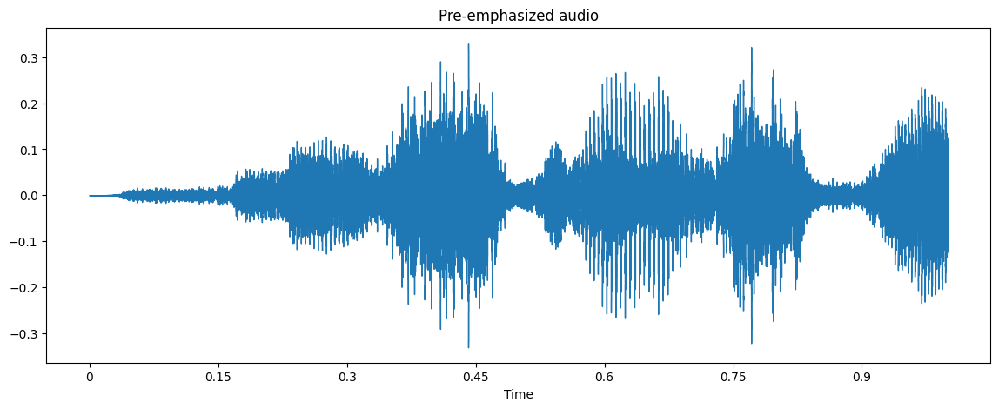

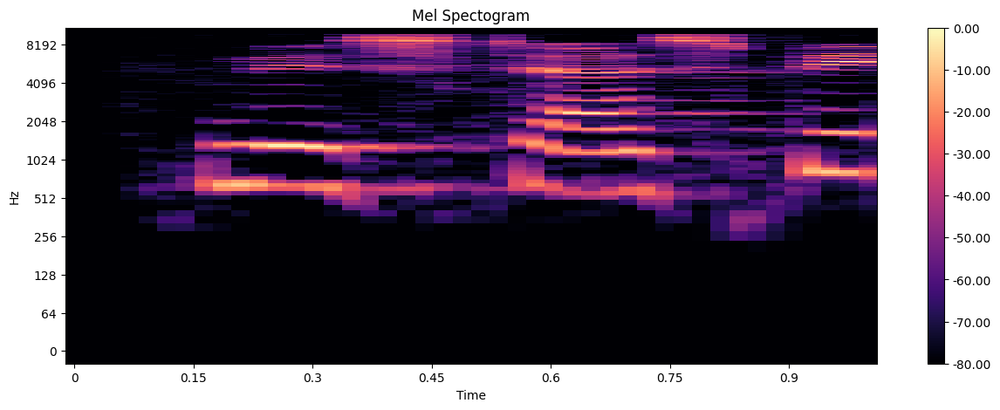

In [31]:
data,sample_rate=preemphasis_and_waveplot(data,sample_rate)
spectogram(data,sample_rate,speaker)
Audio("/kaggle/working/output.wav")

<Axes: >

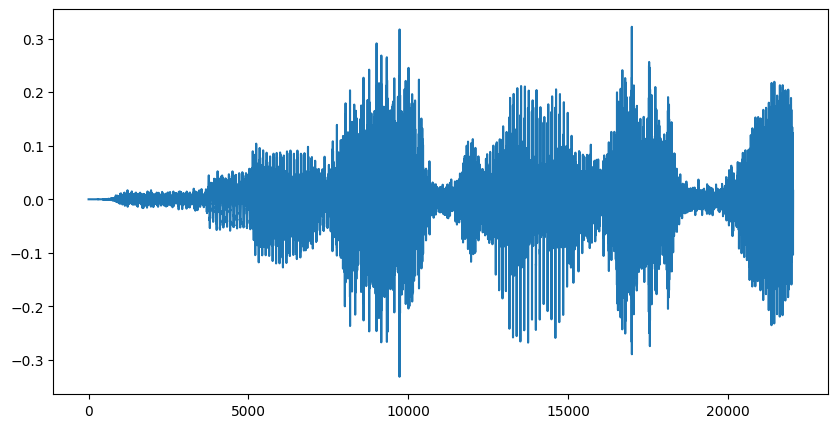

In [32]:
pd.Series(data).plot(figsize=(10,5))

<Axes: >

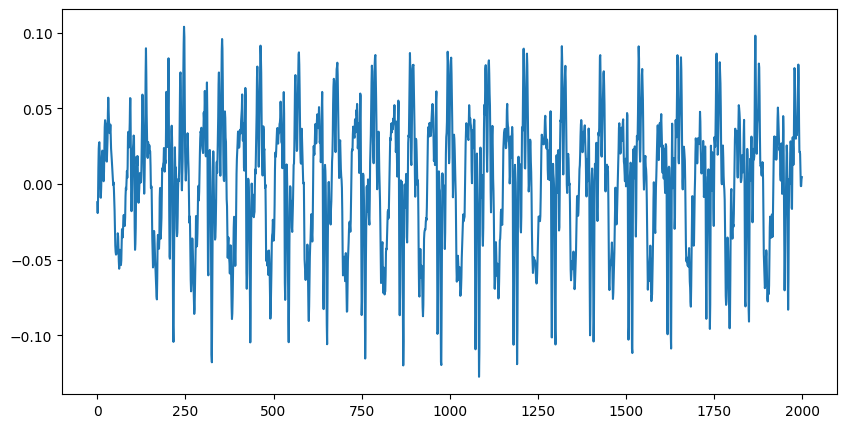

In [33]:
pd.Series(data[5000:7000]).plot(figsize=(10,5))

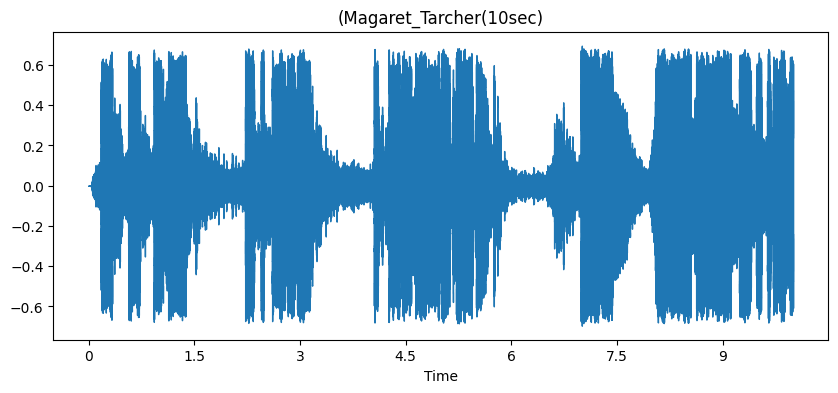

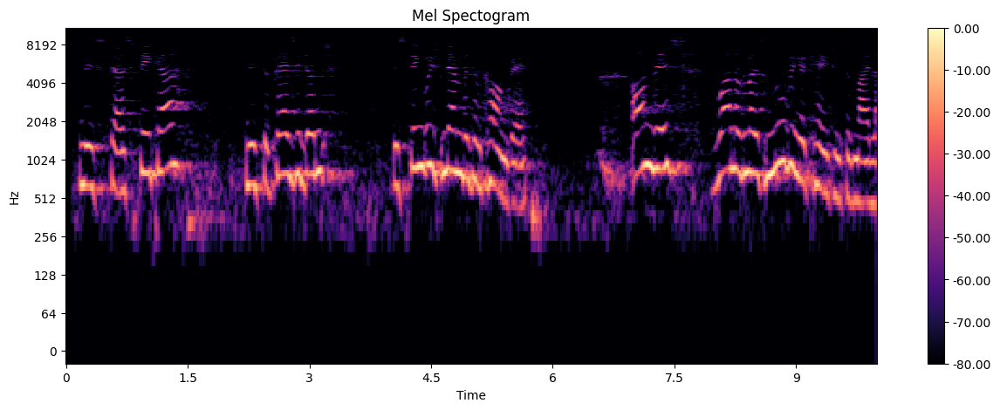

In [34]:
speaker="(Magaret_Tarcher(10sec)"
path='/kaggle/working/Magaret_Tarcherc.wav'
data,sample_rate=librosa.load(path)
waveplot(data,sample_rate,speaker)
spectogram(data,sample_rate,speaker)
Audio(path)

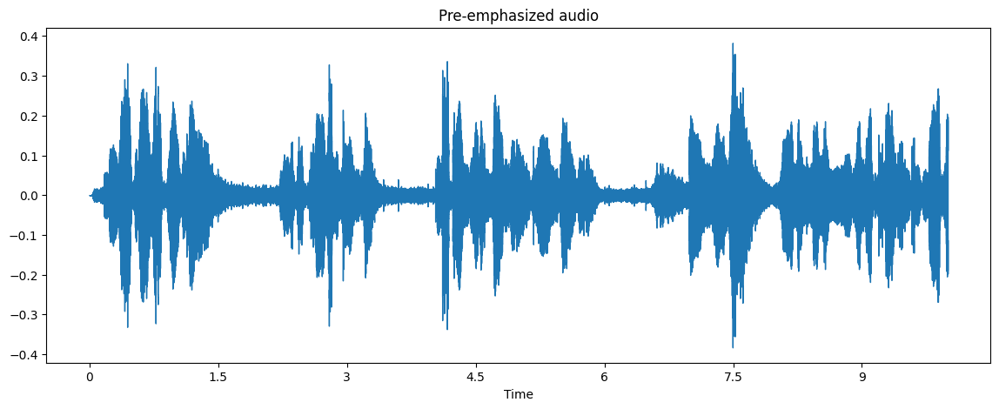

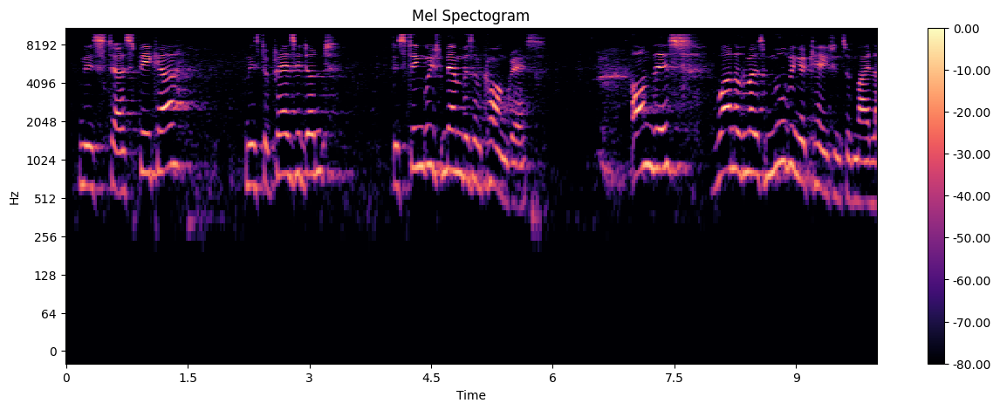

In [35]:
data,sample_rate=preemphasis_and_waveplot(data,sample_rate)
spectogram(data,sample_rate,speaker)
Audio("/kaggle/working/output.wav")

**Nelson_Mandela**

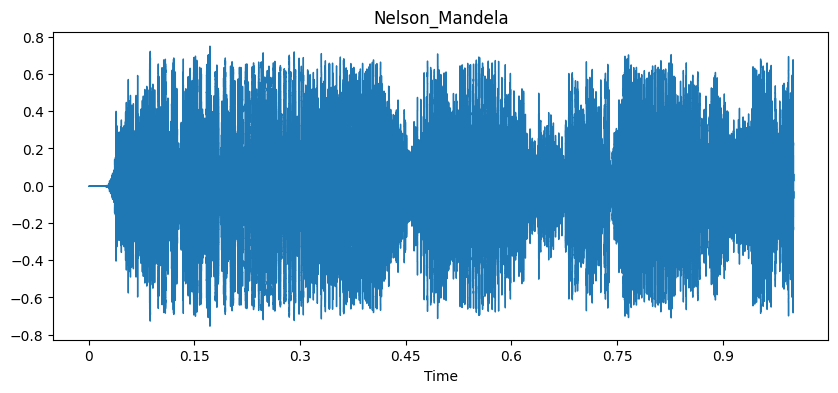

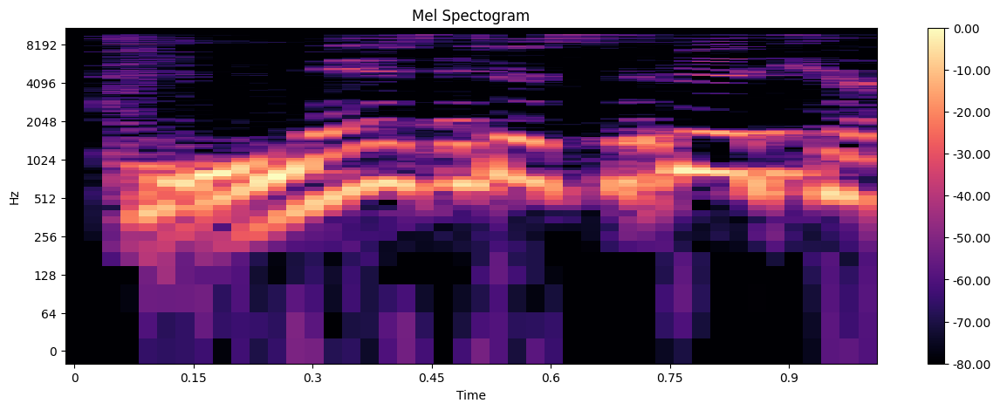

In [36]:
speaker="Nelson_Mandela"
path='./speaker-recognition-dataset/16000_pcm_speeches/audio/Nelson_Mandela/0.wav'
data,sample_rate=librosa.load(path)
waveplot(data,sample_rate,speaker)
spectogram(data,sample_rate,speaker)
Audio(path)

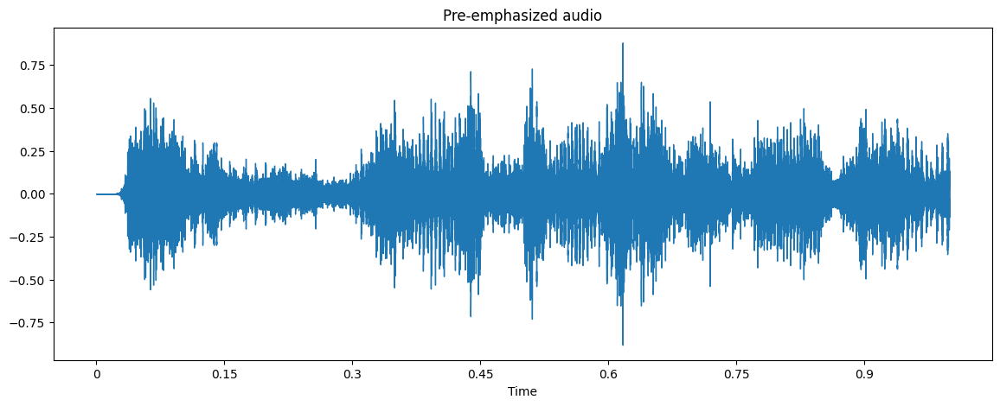

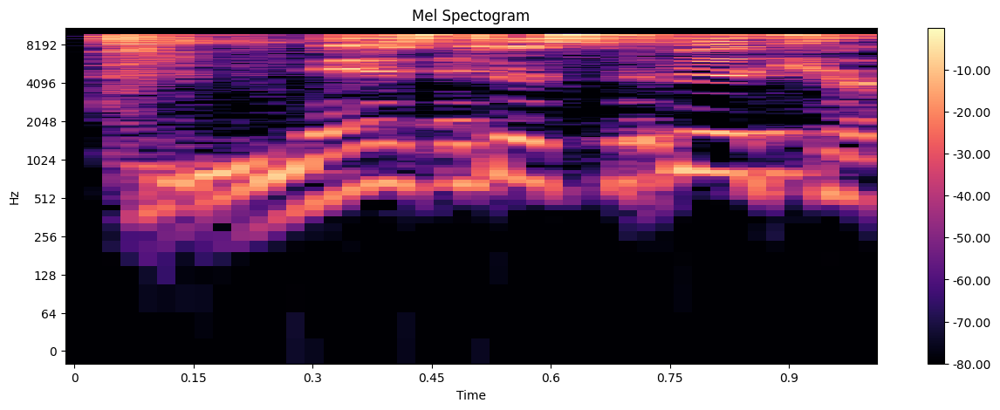

In [37]:
data,sample_rate=preemphasis_and_waveplot(data,sample_rate)
spectogram(data,sample_rate,speaker)
Audio("/kaggle/working/output.wav")

<Axes: >

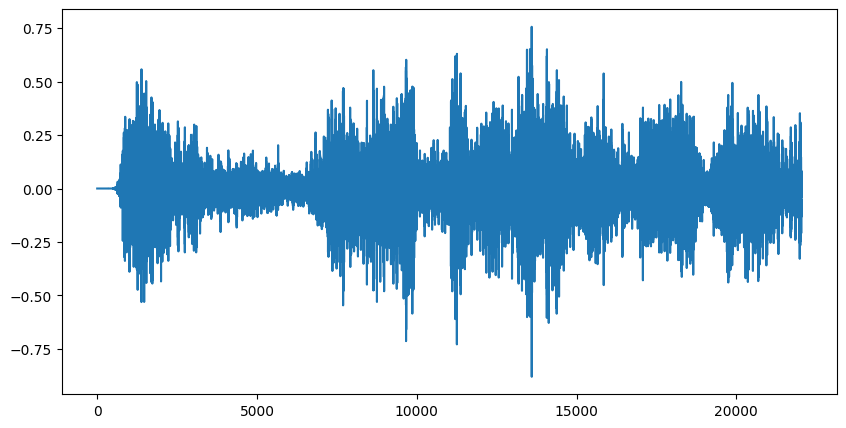

In [38]:
pd.Series(data).plot(figsize=(10,5))

<Axes: >

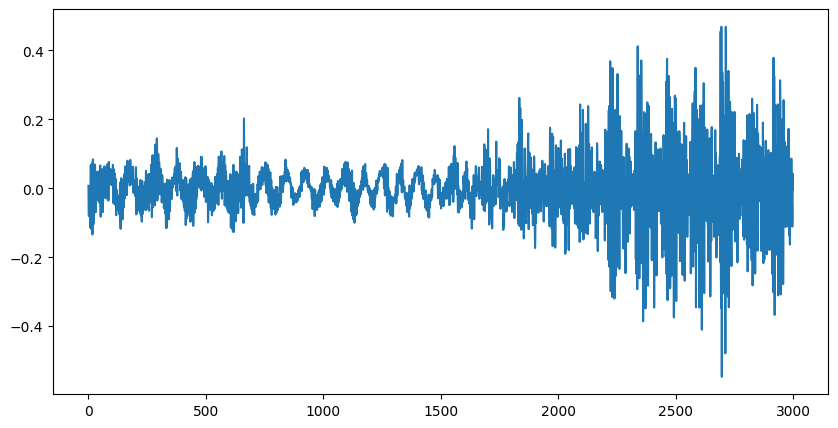

In [39]:
pd.Series(data[5000:8000]).plot(figsize=(10,5))

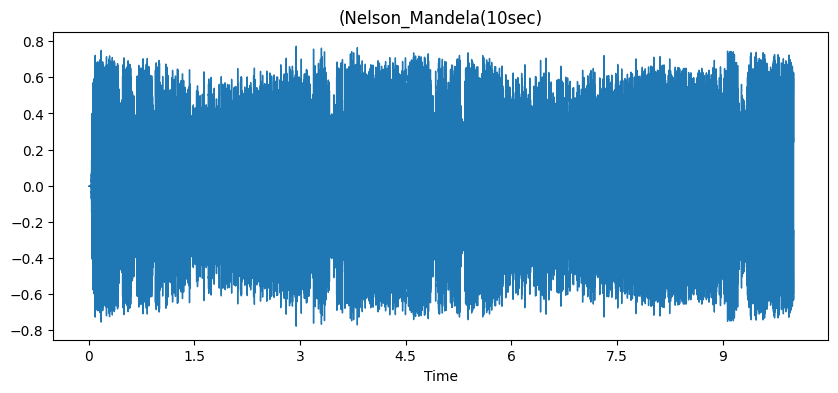

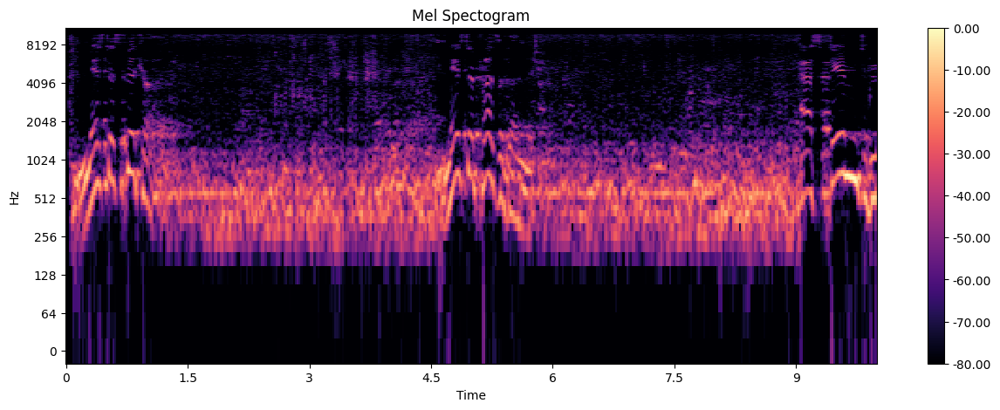

In [40]:
speaker="(Nelson_Mandela(10sec)"
path='/kaggle/working/Nelson_Mandelac.wav'
data,sample_rate=librosa.load(path)
waveplot(data,sample_rate,speaker)
spectogram(data,sample_rate,speaker)
Audio(path)

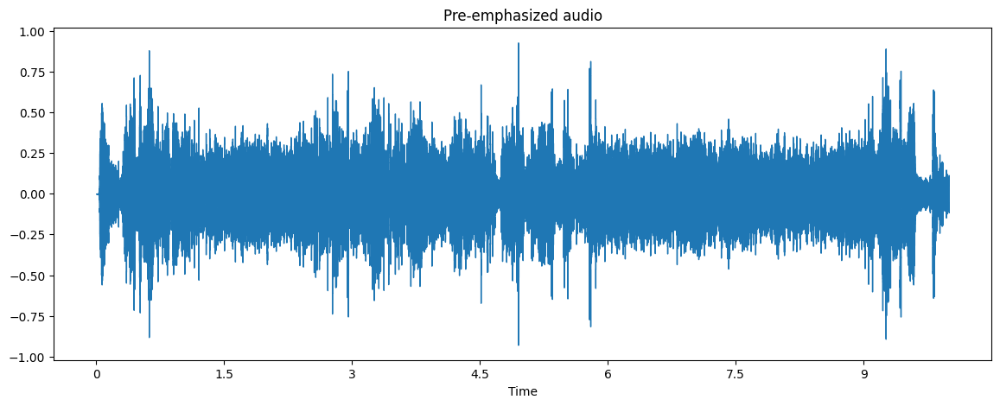

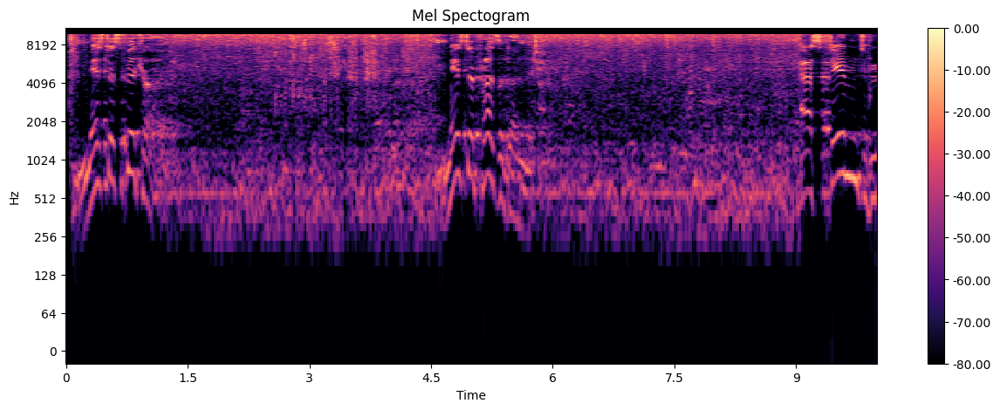

In [41]:
data,sample_rate=preemphasis_and_waveplot(data,sample_rate)
spectogram(data,sample_rate,speaker)
Audio("/kaggle/working/output.wav")

In [42]:
filename="./speaker-recognition-dataset/16000_pcm_speeches/audio/Nelson_Mandela/0.wav"
sr = librosa.get_samplerate(filename)
print("sample rate :",sr)

sample rate : 16000


**EDA ON NOISE FOLDER**

In [43]:
os.listdir(noise_path)

['_background_noise_', 'other']

In [44]:
num_noise=[]
for i in os.listdir(noise_path):
    p=os.listdir(noise_path+"/"+i)
    len_class=len(p)
    num_noise.append(len_class)
num_noise

[4, 2]

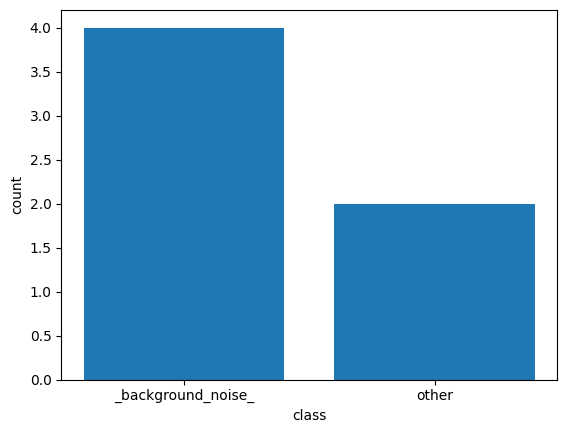

In [45]:
plt.bar(os.listdir(noise_path),num_noise)

plt.ylabel("count")
plt.xlabel("class")
plt.show()

Imbalance classes different number of wav files (4 and 2)

In [46]:
noise_paths = []
for subdir in os.listdir(noise_path):
    subdir_path = Path(noise_path) / subdir
    if os.path.isdir(subdir_path):
        noise_paths += [
            os.path.join(subdir_path, filepath)
            for filepath in os.listdir(subdir_path)
            if filepath.endswith(".wav")
        ]

In [47]:
noise_paths

['speaker-recognition-dataset/16000_pcm_speeches/noise/_background_noise_/doing_the_dishes.wav',
 'speaker-recognition-dataset/16000_pcm_speeches/noise/_background_noise_/dude_miaowing.wav',
 'speaker-recognition-dataset/16000_pcm_speeches/noise/_background_noise_/running_tap.wav',
 'speaker-recognition-dataset/16000_pcm_speeches/noise/_background_noise_/10convert.com_Audience-Claps_daSG5fwdA7o.wav',
 'speaker-recognition-dataset/16000_pcm_speeches/noise/other/pink_noise.wav',
 'speaker-recognition-dataset/16000_pcm_speeches/noise/other/exercise_bike.wav']

In [48]:
for i in noise_paths:
    filename=i
    sr = librosa.get_samplerate(filename)
    print(f"sample rate of{os.path.basename(i)} ",sr)

sample rate ofdoing_the_dishes.wav  22050
sample rate ofdude_miaowing.wav  22050
sample rate ofrunning_tap.wav  22050
sample rate of10convert.com_Audience-Claps_daSG5fwdA7o.wav  44100
sample rate ofpink_noise.wav  22050
sample rate ofexercise_bike.wav  22050


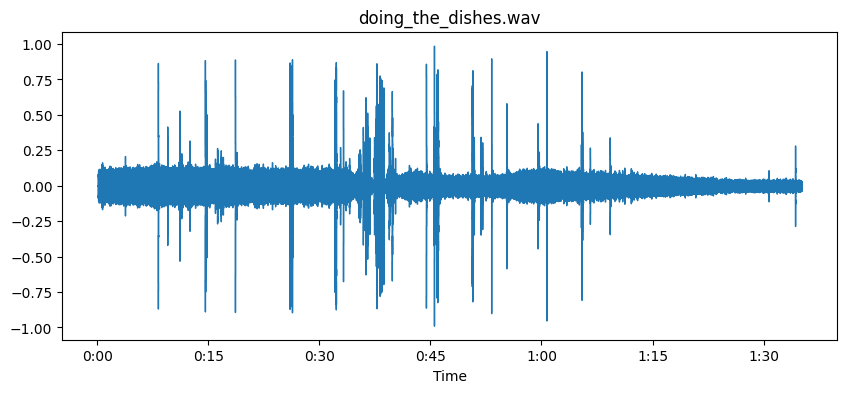

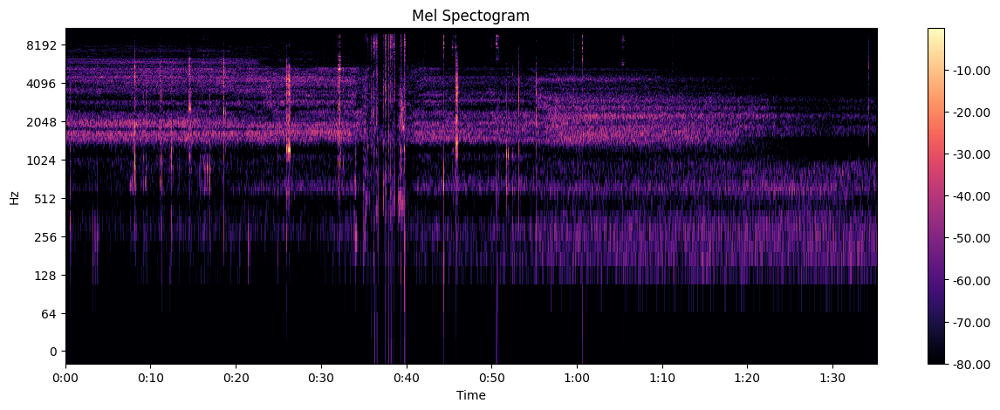

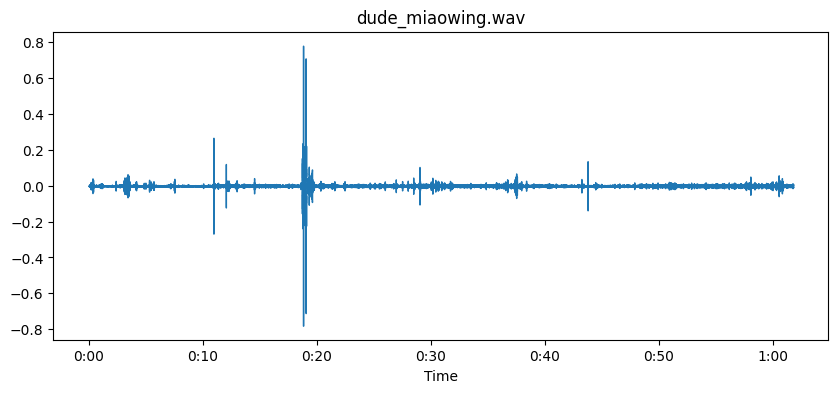

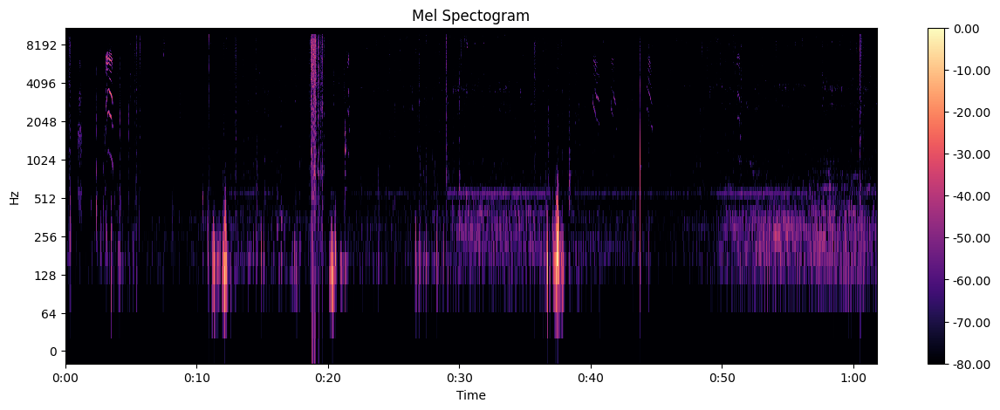

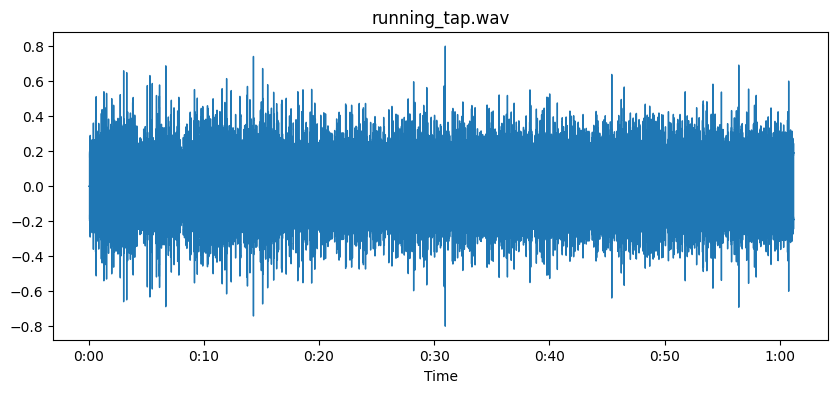

...

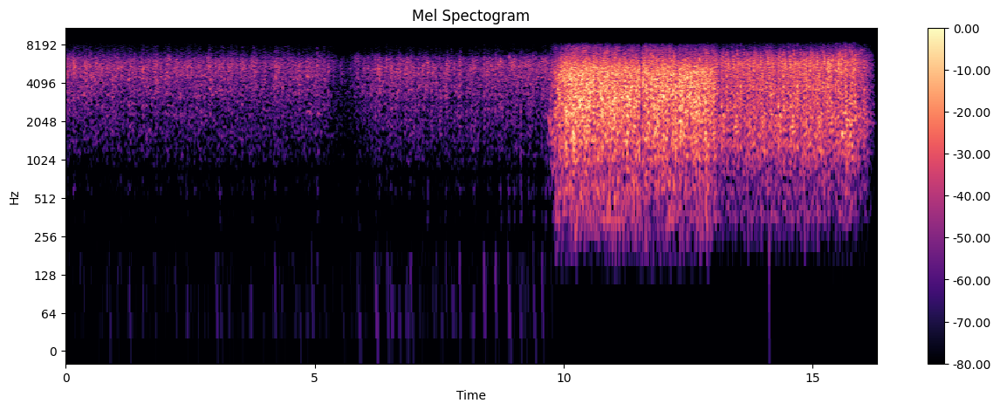

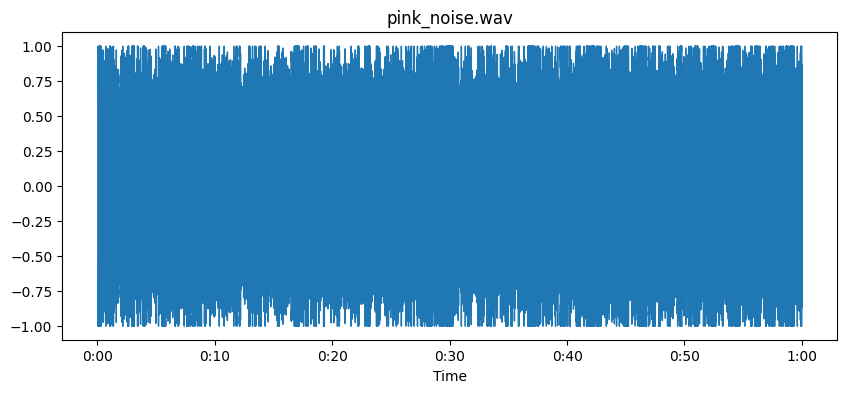

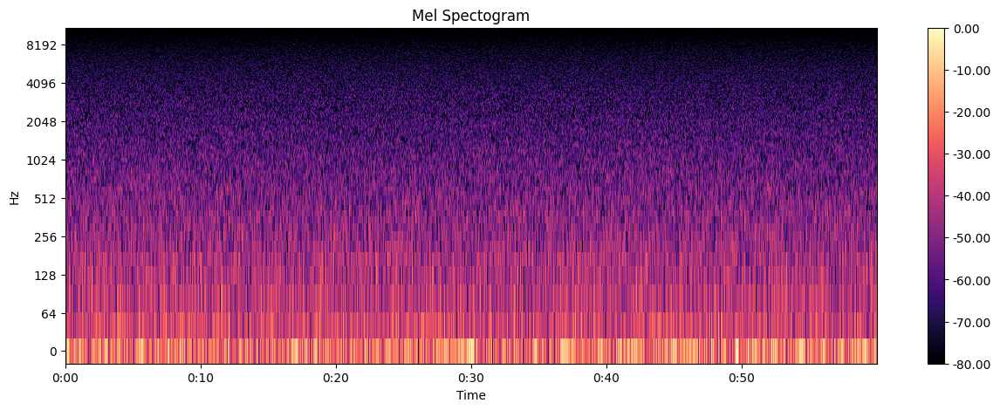

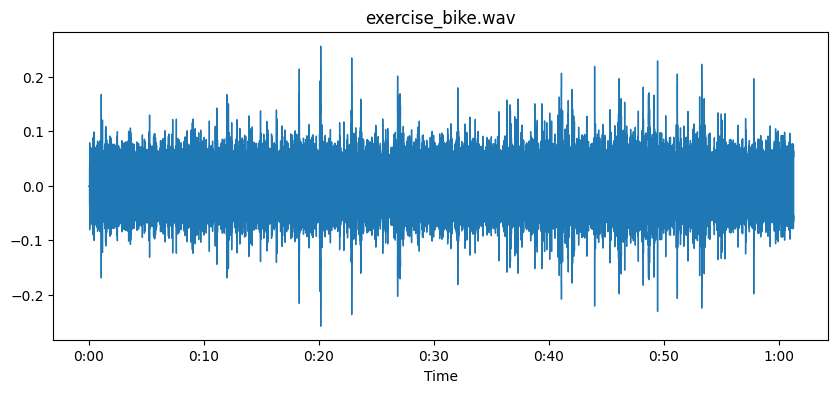

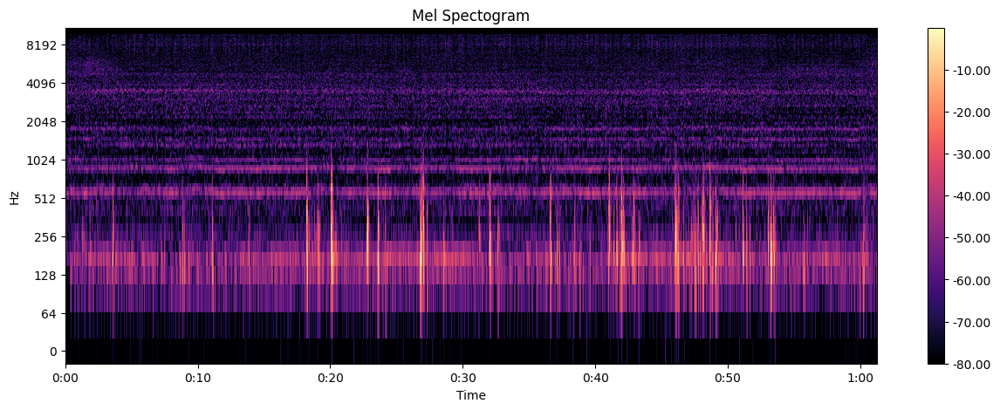

In [49]:
for i in noise_paths:
    speaker = os.path.basename(i)
    path=i
    data,sample_rate=librosa.load(path)
    waveplot(data,sample_rate,speaker)
    spectogram(data,sample_rate,speaker)
    
    


Since noise files are not sampled at 16000 Hz, but we will resample them to 16000 Hz

this script resamples all .wav files in a specified path  to have a sample rate of 16000 Hz.

In [50]:
command = (
    "for dir in `ls -1 " + noise_path + "`; do "
    "for file in `ls -1 " + noise_path + "/$dir/*.wav`; do "
    "sample_rate=`ffprobe -hide_banner -loglevel panic -show_streams "
    "$file | grep sample_rate | cut -f2 -d=`; "
    "if [ $sample_rate -ne 16000 ]; then "
    "ffmpeg -hide_banner -loglevel panic -y "
    "-i $file -ar 16000 temp.wav; "
    "mv temp.wav $file; "
    "fi; done; done"
)

os.system(command)

0

In [51]:


SAMPLING_RATE = 16000

def load_noise_sample(path):
    # Load the audio file with librosa
    sample, sampling_rate = librosa.load(path, sr=None)

    if sampling_rate == SAMPLING_RATE:
        # Number of slices of 16000 each that can be generated from the noise sample
        slices = int(len(sample) / SAMPLING_RATE)
        
        # Reshape the array to create slices
        sample = np.reshape(sample[:slices * SAMPLING_RATE], (slices, SAMPLING_RATE))
        
        return sample
    else:
        print("Sampling rate for {} is incorrect. Ignoring it".format(path))
        return None

noises = []
for path in noise_paths:
    sample = load_noise_sample(path)
    if sample is not None:
        noises.extend(sample)

# Convert list to numpy array
noises = np.array(noises)

print(
    "{} noise files were split into {} noise samples where each is {} sec. long".format(
        len(noise_paths), len(noises), SAMPLING_RATE // SAMPLING_RATE
    )
)


6 noise files were split into 354 noise samples where each is 1 sec. long


In [52]:
noises.shape

(354, 16000)

Feature Extraction: 
1. MFCC, 13 coefficients, standardised
2. Some Statistical features are calculated
3. Spectral features are calculated


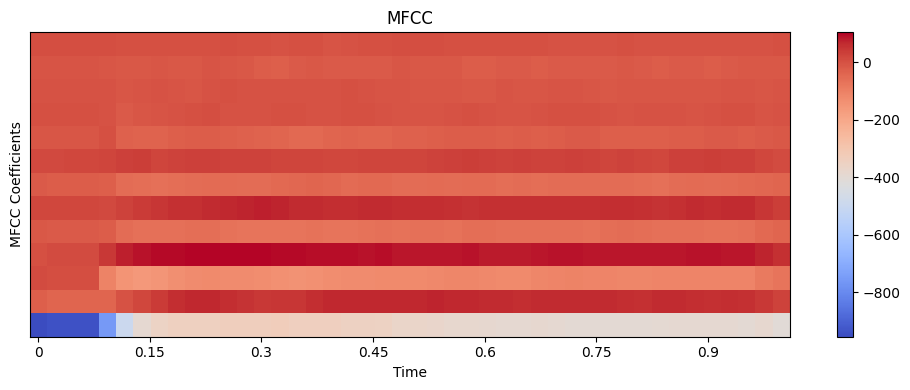

[-436.0294       47.615707   -107.76182      80.948494    -57.876827
   53.703568    -49.299522     26.054981    -24.808443     -0.96656203
   -5.8759995   -15.066702      2.4758148 ]


In [53]:
mfcc_vals=plot_mfcc(data_ft,sample_rat_ft)
print(np.mean(mfcc_vals.T, axis=0))

In [54]:
mean = np.mean(data_ft)
std_dev = np.std(data_ft)
skewness = np.mean((data_ft - mean) ** 3) / (std_dev ** 3)
kurtosis = np.mean((data_ft - mean) ** 4) / (std_dev ** 4)

# Print the calculated statistical features
print(f"Mean: {mean}")
print(f"Standard Deviation: {std_dev}")
print(f"Skewness: {skewness}")
print(f"Kurtosis: {kurtosis}")

Mean: -4.7108744638535427e-07
Standard Deviation: 0.007033522706478834
Skewness: 0.04948311872662086
Kurtosis: 5.756526505527238


In [55]:
spectral_centroid = librosa.feature.spectral_centroid(y=data_ft)
spectral_bandwidth = librosa.feature.spectral_bandwidth(y=data_ft)
spectral_contrast = librosa.feature.spectral_contrast(y=data_ft)
spectral_flatness = librosa.feature.spectral_flatness(y=data_ft)

# Print or use the computed features
print("Spectral Centroid:", spectral_centroid)
print("Spectral Bandwidth:", spectral_bandwidth)
print("Spectral Contrast:", spectral_contrast)
print("Spectral Flatness:", spectral_flatness)

Spectral Centroid: [[5792.59136087 5650.48974509 5629.94343912 5651.2238979  3787.51363923
  3611.8132853  3589.86681265 3574.3952834  3566.32188561 3554.73040049
  3616.5794226  3808.11585816 3990.35790697 4109.50508056 3855.62152254
  3688.99518834 3509.91535596 3502.92283597 3544.45417874 3602.33640997
  3617.00876039 3671.11268927 3557.12699665 3541.45259963 3574.7699229
  3606.21831692 3585.15271009 3600.33243732 3694.78782504 3672.87631155
  3768.27319613 3792.34997979 3697.63292806 3693.08157896 3687.30836729
  3708.41920821 3752.99358051 3783.74186614 3816.48564686 3928.24108938
  3923.62269022 3888.91926544 3829.55383601 3803.58191965]]
Spectral Bandwidth: [[1778.34603548 1742.18317089 1717.65747405 1725.31466733 1718.1104984
  1662.69332971 1666.81203607 1689.53280917 1783.19096438 1837.36385482
  1862.47000661 1793.37784818 1791.13666298 1805.3929361  1778.46552447
  1708.89623297 1737.51852039 1771.07892846 1798.79644784 1872.33996676
  1876.14311593 1892.69631633 1895.8300

In [56]:
pip install aubio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 479.0/479.0 kB 6.5 MB/s eta 0:00:0000:0100:01
  Preparing metadata (setup.py) ... done
  Created wheel for aubio: filename=aubio-0.4.9-cp310-cp310-linux_x86_64.whl size=150470 sha256=30773243da0487406ed8c396b325c60899add3ebc829811339f87e0929ce1e50
  Stored in directory: /root/.cache/pip/wheels/00/30/30/a06fe7e9c7fe740486c219851b2bc1c7ed4a97e9c257efd3d7
Successfully built aubio
Note: you may need to restart the kernel to use updated packages.


In [57]:
import numpy as np
import aubio
import tempfile

temp_wav_file = tempfile.NamedTemporaryFile(suffix=".wav", delete=False)
sf.write(temp_wav_file.name, data_ft, sample_rat_ft)

# Create an aubio source
audio_source = aubio.source(temp_wav_file.name, samplerate=sample_rate)

# Create a pitch object
pitch_detector = aubio.pitch("yin", samplerate=sample_rat_ft)

# Create an array to store pitch values
pitch_values = []

# Process the audio and extract pitch
total_frames = 0
while True:
    audio_frame, read = audio_source()
    pitch_value = pitch_detector(audio_frame)[0]
    pitch_values.append(pitch_value)
    total_frames += read
    if read < audio_source.hop_size:
        break

# Now, 'pitch_values' contains the estimated pitch values
print("Pitch values:", pitch_values)



Pitch values: [0.0, 0.0, 0.0, 0.0, 0.0, 3270.002, 2710.0552, 2653.8142, 2518.2139, 99.35046, 2381.1362, 2445.143, 2475.1228, 187.14133, 2787.076, 3302.365, 3236.083, 1548.9677, 808.4891, 1618.0868, 62.171986, 52.520924, 95.090225, 47.69308, 43.811592, 99.218666, 77.73279, 2445.909, 2475.1047, 98.43322, 117.26669, 101.94257, 50.486774, 2269.966, 2206.49, 2405.2249, 209.72592, 206.39597, 194.07613, 2265.6887, 68.45096, 45.99617, 146.9818, 0.0]


In [58]:
max_pitch = max(pitch_values)
min_pitch = min(pitch_values)
mean_pitch = sum(pitch_values) / len(pitch_values)

print("Maximum Pitch:", max_pitch, "Hz")
print("Minimum Pitch:", min_pitch, "Hz")
print("Mean Pitch:", mean_pitch, "Hz")

Maximum Pitch: 3302.365 Hz
Minimum Pitch: 0.0 Hz
Mean Pitch: 1086.9869384765625 Hz


In [59]:
! pip install noisereduce


In [60]:
import os
from noisereduce import reduce_noise
from pydub import AudioSegment

In [61]:
target_audio = AudioSegment.from_file("/kaggle/working/Benjamin_Netanyauc.wav")
noise_profile = None
noise_folder_path = "/kaggle/working/speaker-recognition-dataset/16000_pcm_speeches/noise/_background_noise_"
for noise_file in os.listdir(noise_folder_path):
    noise_audio = AudioSegment.from_file(os.path.join(noise_folder_path, noise_file))
    noise_array = np.array(noise_audio.get_array_of_samples())
    if noise_profile is None:
        noise_profile = np.zeros(len(target_audio))
    if len(noise_array) > len(noise_profile):
        noise_profile = np.pad(noise_profile, (0, len(noise_array) - len(noise_profile)), 'constant')
    elif len(noise_array) < len(noise_profile):
        noise_array = np.pad(noise_array, (0, len(noise_profile) - len(noise_array)), 'constant')
    noise_profile += noise_array

noise_profile /= len(os.listdir(noise_folder_path))

target_array = np.array(target_audio.get_array_of_samples())
reduced_audio = reduce_noise(y=target_array, sr=target_audio.frame_rate, y_noise=noise_profile)

cleaned_audio = AudioSegment(
        reduced_audio.tobytes(),
        frame_rate=target_audio.frame_rate,
        sample_width=target_audio.sample_width,
        channels=target_audio.channels
)
cleaned_audio.export("/kaggle/working/noise_removed_Benjamin.wav", format="wav")

<_io.BufferedRandom name='/kaggle/working/noise_removed_Benjamin.wav'>

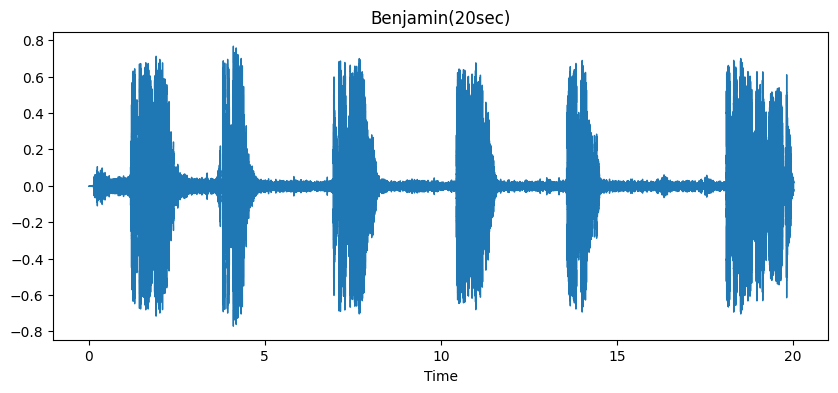

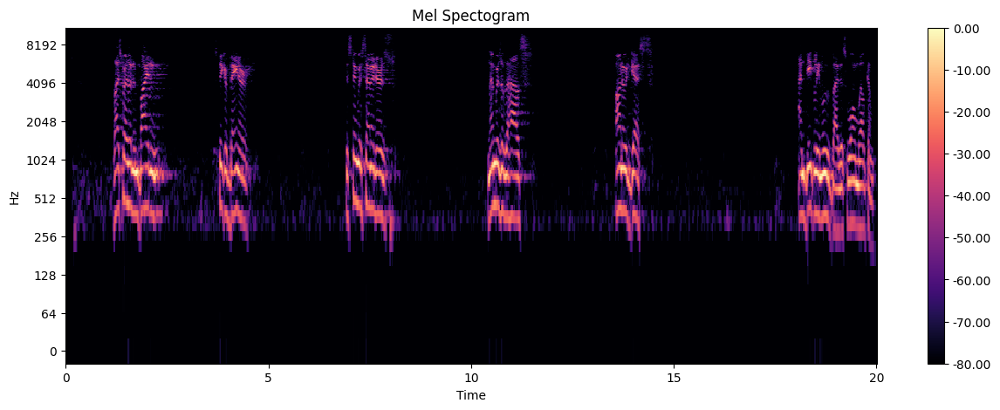

In [62]:
speaker="Benjamin(20sec)"
path="/kaggle/working/Benjamin_Netanyauc.wav"
data,sample_rat=librosa.load(path)
waveplot(data,sample_rat,speaker)
spectogram(data,sample_rat,speaker)
Audio(path)



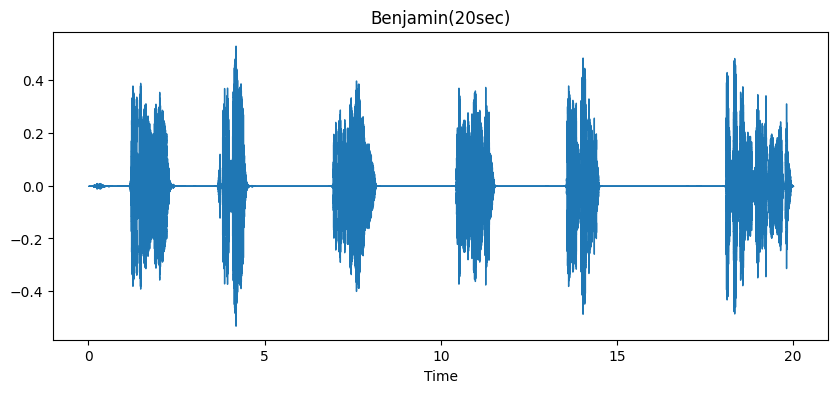

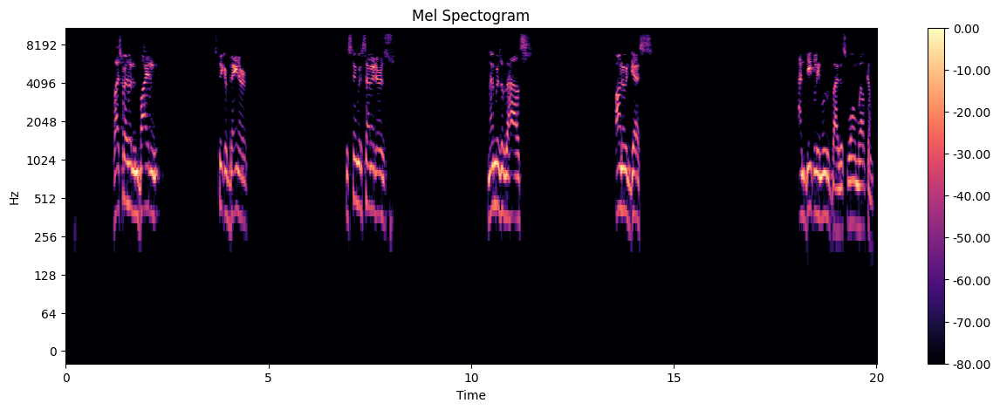

In [63]:
speaker="Benjamin(20sec)"
path='/kaggle/working/noise_removed_Benjamin.wav'
data,sample_rat=librosa.load(path)
waveplot(data,sample_rat,speaker)
spectogram(data,sample_rat,speaker)
Audio(path)

In [64]:
#Removing silence
from pydub import AudioSegment

original_audio = AudioSegment.from_file("/kaggle/working/noise_removed_Benjamin.wav", format="wav")

silence_threshold = -40

cleaned_audio = sum([chunk for chunk in original_audio if chunk.dBFS > silence_threshold])

cleaned_audio.export("/kaggle/working/silence_removed_audio_Benjamin.wav", format="wav")

<_io.BufferedRandom name='/kaggle/working/silence_removed_audio_Benjamin.wav'>

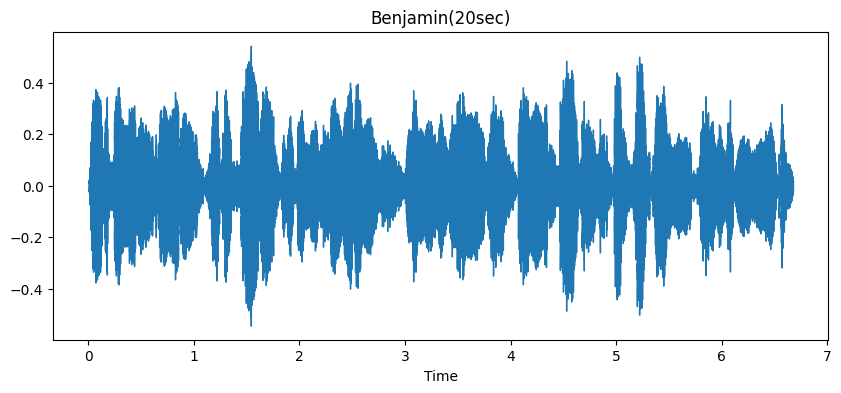

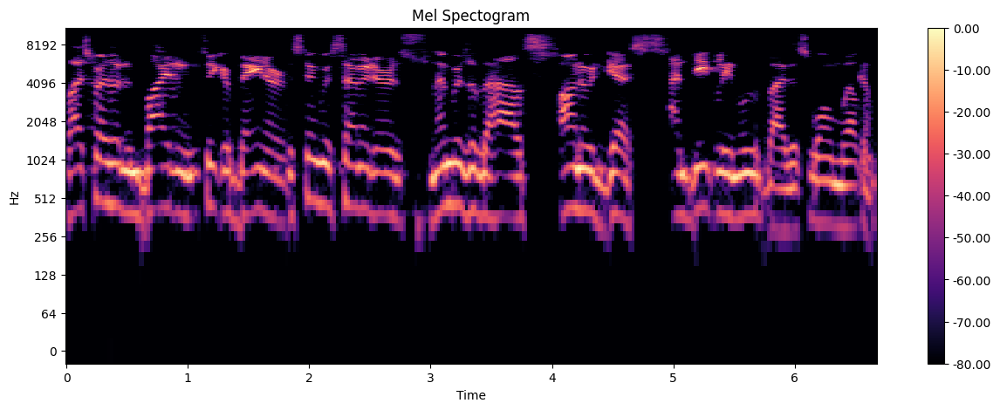

In [65]:
speaker="Benjamin(20sec)"
path='/kaggle/working/silence_removed_audio_Benjamin.wav'
data,sample_rat=librosa.load(path)
waveplot(data,sample_rat,speaker)
spectogram(data,sample_rat,speaker)
Audio(path)